### 模块调取

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import IPython
import sklearn as sk
from sklearn.preprocessing import StandardScaler
from torch import nn,optim,Tensor
import torch
from tqdm import tqdm
import matplotlib.dates as mdates
import datetime
from sklearn.metrics import r2_score

C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### 读取数据

In [4]:
root=r"D:\Business\LSTM_NN700_completed+200_completed\data\raw_data.csv"
data = pd.read_csv(root)
train_data=data[:649]#before 2021.12.31

In [5]:
file=r"five.csv"
five_data = pd.read_csv(file)
five_data['jm']

0      1447.5
1      1420.0
2      1434.0
3      1434.0
4      1435.0
        ...  
784    3368.0
785    3519.5
786    3531.5
787    3792.0
788    3741.0
Name: jm, Length: 789, dtype: float64

In [6]:
rb,hc,jm,j,i=np.array(five_data['rb']),np.array(five_data['hc']),np.array(five_data['jm']),np.array(five_data['j']),np.array(five_data['i'])
# date1 = datetime.date(2019,1,1)
# date2 = datetime.date(2022,12,31)
# delta = datetime.timedelta(days = 2)
# dates = mdates.drange(date1, date2, delta)
plt.rcParams['figure.figsize'] = [15,5]
mpl.rcParams['figure.dpi']=1000
length=789
plt.plot(np.arange(length),jm[:length],color='seagreen',label='jm')
plt.plot(np.arange(length),j[:length],color='indianred',label='j')
plt.plot(np.arange(length),i[:length],color='orange',label='i')
plt.plot(np.arange(length),rb[:length],color='royalblue',label='rb')
plt.plot(np.arange(length),hc[:length],color='darkgoldenrod',label='hc')
plt.xlabel('Time')
plt.ylabel('Price')
plt.xticks([0,100,200,300,400,500,600,700,800],['2019-01-02','2019-06-03','2019-10-30','2020-03-27','2020-08-24','2021-01-20','2021-06-23','2021-11-19','2022-04-01'])
plt.legend()

### 查看数据

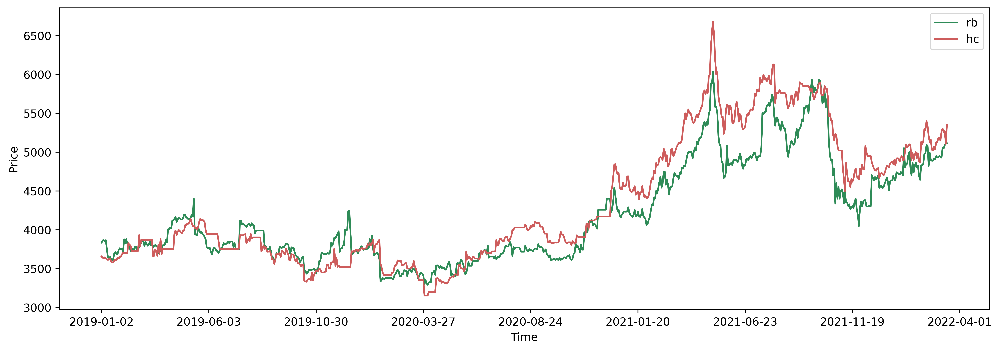

In [7]:
rb_arr,hc_arr=np.array(data['rb']),np.array(data['hc'])
# date1 = datetime.date(2019,1,1)
# date2 = datetime.date(2022,12,31)
# delta = datetime.timedelta(days = 2)
# dates = mdates.drange(date1, date2, delta)
plt.rcParams['figure.figsize'] = [15,5]
mpl.rcParams['figure.dpi']=600
plt.plot(np.arange(len(rb_arr)),rb_arr,color='seagreen',label='rb')
plt.plot(np.arange(len(rb_arr)),hc_arr,color='indianred',label='hc')
plt.xlabel('Time')
plt.ylabel('Price')
plt.xticks([0,100,200,300,400,500,600,700,800],['2019-01-02','2019-06-03','2019-10-30','2020-03-27','2020-08-24','2021-01-20','2021-06-23','2021-11-19','2022-04-01'])
plt.legend()


### 查看两者相关性

len(X_train):649


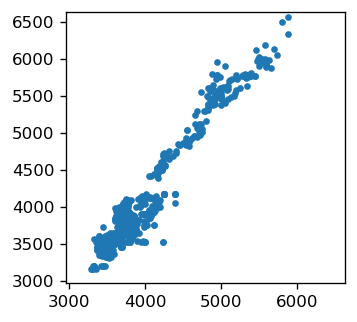

In [8]:
plt.rcParams['figure.figsize'] = [3,3]
mpl.rcParams['figure.dpi']=120
max_v = max(train_data['rb'].max(),train_data['rb'].max()) * 1.1
min_v = min(train_data['rb'].min(),train_data['rb'].min()) * 0.9
plt.plot(train_data['rb'],train_data['hc'],'.')
plt.xlim(min_v,max_v)
plt.ylim(min_v,max_v)
#DataFrame-->Numpy
X_train=np.array(train_data['rb'])
y_train=np.array(train_data['hc'])
print('len(X_train):{}'.format(len(X_train)))

## 1. 线性回归

In [9]:
#数据标准化
from sklearn.preprocessing import StandardScaler
# 转换为二维数组，冗余，但不得不做
X_train = X_train.reshape(-1,1) # 1 列
y_train = y_train.reshape(-1,1) # 1 列

# 拟合
scalerX = StandardScaler().fit(X_train)
scalery = StandardScaler().fit(y_train)
# 对 X_train、y_train 标准化
X_train = scalerX.transform(X_train)
y_train = scalery.transform(y_train)

# 转为一维数组
y_train = y_train.reshape(-1,)

In [10]:
#评价
#r2_score 评价方法
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score, KFold
def train_and_evaluate(regr, X_train, y_train):
    regr.fit(X_train, y_train)  # 训练

    print ("在训练集上，决定系数：", regr.score(X_train, y_train))

    # 创建 K-折
    cv = KFold(5, shuffle=True, random_state=33)                     # model_selection 模块用
    #cv = KFold(X_train.shape[0], 5, shuffle=True, random_state=33)  # cross_validation 模块用

    scores = cross_val_score(regr, X_train, y_train, cv=cv)
    print ("使用 K-折交叉验证的 平均决定系数:",np.mean(scores))

In [11]:
from sklearn import linear_model
regr_sgd = linear_model.SGDRegressor(loss='squared_loss', penalty=None, max_iter=5, tol=None, random_state=42)
train_and_evaluate(regr_sgd, X_train, y_train)

在训练集上，决定系数： 0.9345073976309601
使用 K-折交叉验证的 平均决定系数: 0.9332866722241487


C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed i

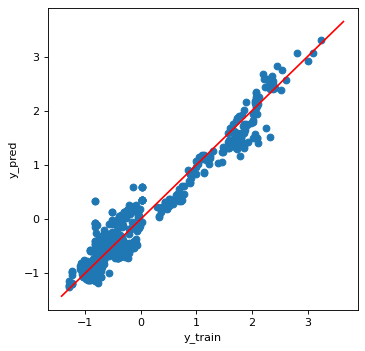

In [12]:
#可视化
mpl.rcParams['figure.dpi']=80
plt.rcParams['figure.figsize'] = [5,5]
def visualization_for_predict_data(data_observed, data_predicted, label_observed, label_predicted):
    plt.scatter(data_observed, data_predicted)

    max_v = np.max([data_predicted] + [data_observed]) * 1.1
    min_v = np.min([data_predicted] + [data_observed]) * 1.1

    plt.plot([min_v,max_v], [min_v,max_v], "r-")

    plt.xlabel(label_observed)
    plt.ylabel(label_predicted)
X_train=X_train.reshape(-1,1)
y_pred = regr_sgd.predict(X_train)
# y_pred=y_pred.reshape(-1,1)
visualization_for_predict_data(y_train, y_pred, "y_train", "y_pred")

### 斜率&截距

In [13]:
print("after standard:regr_sgd.coef_ = {}\n".format(regr_sgd.coef_))
print("after standard:regr_sgd.intercept_ = {}\n".format(regr_sgd.intercept_))
sigma_x=train_data['rb'].std()
sigma_y=train_data['hc'].std()
mean_x=train_data['rb'].mean()
mean_y=train_data['hc'].mean()
coef=regr_sgd.coef_*(sigma_y/sigma_x)
intercept=(regr_sgd.intercept_*sigma_y)-(coef*mean_x-mean_y)
print("raw coef_ = {}\n".format(coef))
print("raw intercept_ = {}\n".format(intercept))

after standard:regr_sgd.coef_ = [0.96352773]

after standard:regr_sgd.intercept_ = [-1.15238137e-05]

raw coef_ = [1.29030888]

raw intercept_ = [-1057.9791076]



Text(0, 0.5, 'HC')

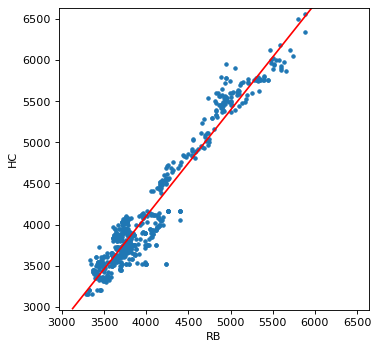

In [14]:
plt.rcParams['figure.figsize'] = [5,5]
max_v = max(train_data['rb'].max(),train_data['rb'].max()) * 1.1
min_v = min(train_data['rb'].min(),train_data['rb'].min()) * 0.9
max_l = max(train_data['rb'].max(),train_data['rb'].max()) * 1.05
min_l = min(train_data['rb'].min(),train_data['rb'].min()) * 0.95
plt.plot(train_data['rb'],train_data['hc'],'.')
plt.plot((min_l,max_l), (coef*min_l+intercept,coef*max_l+intercept),"r-")
plt.xlim(min_v,max_v)
plt.ylim(min_v,max_v)
plt.xlabel('RB')
plt.ylabel('HC')

### 求Spread

Beta=[0.77500823]



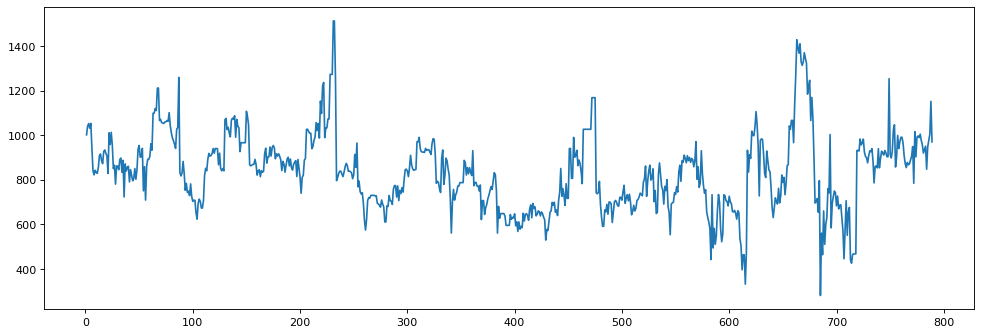

In [15]:
Beta=1/coef
print("Beta={}\n".format(Beta))
Spread=data['rb']-Beta*data['hc']
time=np.linspace(1,789,789)
time1=np.linspace(1,649,649)
time2=np.linspace(649,789,140)
plt.rcParams['figure.figsize'] = [15,5]
plt.plot(time,Spread,'-')

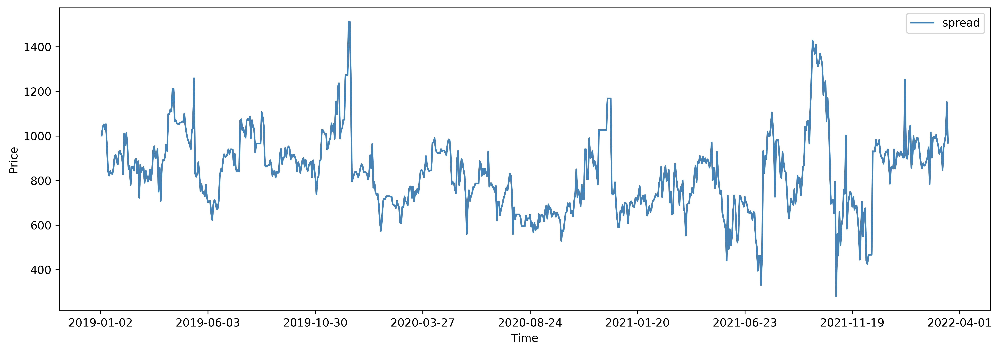

In [16]:
mpl.rcParams['figure.dpi']=600
plt.plot(time,Spread,color='steelblue',label='spread')
# plt.plot(np.arange(len(rb_arr)),hc_arr,color='indianred',label='hc')
plt.xlabel('Time')
plt.ylabel('Price')
plt.xticks([0,100,200,300,400,500,600,700,800],['2019-01-02','2019-06-03','2019-10-30','2020-03-27','2020-08-24','2021-01-20','2021-06-23','2021-11-19','2022-04-01'])

plt.legend()

In [17]:
Spread_arr=np.array(Spread)
Spread_2D=Spread_arr.reshape(-1,1)
scaler = StandardScaler().fit(Spread_2D[:649])
Spread_new=scaler.transform(Spread_2D)
with open('Spread.txt', 'w') as f:
    f.write(str(Spread_arr))

## 2. LSTM_NN

### 数据载入

In [18]:
predict_intake_len=20
from torch.utils.data import Dataset,DataLoader
class Time_Series_Data(Dataset):
    def __init__(self, data):
        self.data = data
#         self.scaler = StandardScaler().fit(data)
#         self.std_data = self.scaler.transform(data)

    def __getitem__(self, idx):
        x_t = torch.tensor(self.data [idx:idx+predict_intake_len]).reshape(-1,1).float()
        y_t = torch.tensor(self.data [idx+predict_intake_len]).float()
        return x_t, y_t

    def __len__(self):
        return len(self.data)-predict_intake_len

### 创建 LSTM 层

In [19]:
class LSTM(nn.Module):
    def __init__(self,
                 input_size = 1,
                 hidden_size = 40,
                 num_layers =4,
                 batch_first = True,
                 dropout =0.3):
        super(LSTM, self).__init__()
        self.num_layers = num_layers
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(
            input_size=input_size,  
            hidden_size=hidden_size,
            num_layers=num_layers, 
            batch_first=batch_first,
            dropout = dropout)
        
        
        self.fc = nn.Sequential(
            nn.Linear(hidden_size*predict_intake_len, 1))
        
    def forward(self, x,h,c):
        r_out, (h,c) = self.lstm(x, (h,c)) 
        out = self.fc(r_out.flatten())
        return out, (h,c)

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import StepLR

### 定义训练和测试函数

In [21]:
def train_loop(dataloader, model, loss_fn, optimizer,scheduler,device):
    h = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    c = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    loss_total =  0
    optimizer.zero_grad()
    outs = []
    truths = []
    for batch_idx, (X,y) in enumerate(dataloader):  
        X,y = X.to(device),y.to(device)
        out,(h,c) = model(X,h,c)
        loss_total+=loss_fn(out, y)
        outs.append(out.to('cpu').item())
        truths.append(y.to('cpu').item())
    # Backpropagation
    loss_total.backward()
    optimizer.step()
    scheduler.step()
    print(f"Train loss: {loss_total.item():>7f}")
    return outs,truths
def test_loop(dataloader, model, loss_fn, device):
    h = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    c = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    loss_total =  0
    with torch.no_grad():
        for batch_idx, (X,y) in enumerate(dataloader):  
            X,y = X.to(device),y.to(device)
            out,(h,c) = model(X,h,c)
            loss_total+=loss_fn(out, y)
        print(f"Test loss: {loss_total.item():>7f}")
def predict(dataloader,model,device):
    h = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    c = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    outs,ys = [],[]
    with torch.no_grad():
        for batch_idx, (X,y) in enumerate(dataloader):  
            X,y = X.to(device),y.to(device)
            out,(h,c) = model(X,h,c)
            outs.append(out.to('cpu'))
            ys.append(y.to('cpu'))
        plt.plot(np.arange(len(ys)),outs,label = 'predict')
        plt.plot(np.arange(len(ys)),ys,label = 'ground truth')
        plt.legend()


In [22]:
def run(device,train_dataloader,test_dataloader,model,loss_fn,optimizer,scheduler,epochs):
    for t in range(epochs):
        print(f"Epoch {t+1}\n-------------------------------")
        outs,truths = train_loop(train_dataloader, model, loss_fn, optimizer,scheduler,device)
        test_loop(test_dataloader, model, loss_fn,device)
    predict(test_dataloader, model,device)

In [23]:
len(Spread_new)

789

### 训练

Epoch 1
-------------------------------
Train loss: 637.960510
Test loss: 225.909851
Epoch 2
-------------------------------
Train loss: 647.648376
Test loss: 215.792908
Epoch 3
-------------------------------
Train loss: 632.525085
Test loss: 208.704895
Epoch 4
-------------------------------
Train loss: 631.256287
Test loss: 205.549240
Epoch 5
-------------------------------
Train loss: 623.059082
Test loss: 202.682068
Epoch 6
-------------------------------
Train loss: 600.790161
Test loss: 196.869278
Epoch 7
-------------------------------
Train loss: 563.340942
Test loss: 183.840271
Epoch 8
-------------------------------
Train loss: 506.034790
Test loss: 165.798279
Epoch 9
-------------------------------
Train loss: 428.556396
Test loss: 171.127029
Epoch 10
-------------------------------
Train loss: 459.641113
Test loss: 165.806870
Epoch 11
-------------------------------
Train loss: 463.758606
Test loss: 159.450348
Epoch 12
-------------------------------
Train loss: 444.847076

Train loss: 204.421936
Test loss: 91.578461
Epoch 98
-------------------------------
Train loss: 211.152237
Test loss: 98.355354
Epoch 99
-------------------------------
Train loss: 211.765991
Test loss: 95.336266
Epoch 100
-------------------------------
Train loss: 209.863449
Test loss: 94.961243
Epoch 101
-------------------------------
Train loss: 211.653534
Test loss: 90.955154
Epoch 102
-------------------------------
Train loss: 211.044647
Test loss: 93.947571
Epoch 103
-------------------------------
Train loss: 211.269516
Test loss: 94.397583
Epoch 104
-------------------------------
Train loss: 214.461578
Test loss: 94.878235
Epoch 105
-------------------------------
Train loss: 212.121811
Test loss: 96.191116
Epoch 106
-------------------------------
Train loss: 199.748718
Test loss: 95.384903
Epoch 107
-------------------------------
Train loss: 214.611832
Test loss: 93.494247
Epoch 108
-------------------------------
Train loss: 204.258301
Test loss: 96.482323
Epoch 109
--

Train loss: 200.226349
Test loss: 87.080673
Epoch 194
-------------------------------
Train loss: 185.419067
Test loss: 87.981949
Epoch 195
-------------------------------
Train loss: 195.240463
Test loss: 89.465233
Epoch 196
-------------------------------
Train loss: 194.758179
Test loss: 82.960854
Epoch 197
-------------------------------
Train loss: 208.891205
Test loss: 83.824120
Epoch 198
-------------------------------
Train loss: 192.519135
Test loss: 82.807060
Epoch 199
-------------------------------
Train loss: 193.251205
Test loss: 82.167297
Epoch 200
-------------------------------
Train loss: 195.858322
Test loss: 82.915558


C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\numpy\core\shape_base.py:65: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  ary = asanyarray(ary)
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\numpy\core\shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\num

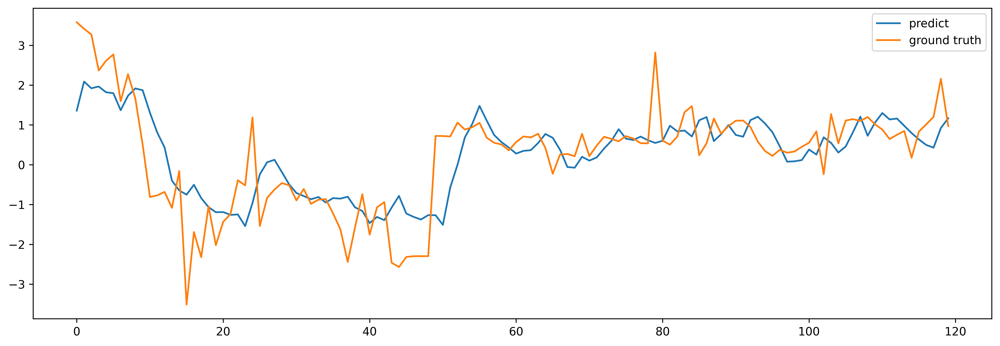

In [47]:
learning_rate = 0.01
scheduler_step_size = 50
scheduler_gamma = 0.5
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_dataloader = Time_Series_Data(Spread_new[:649])
test_dataloader  = Time_Series_Data(Spread_new[649:])

model = LSTM(input_size = 1,
             hidden_size = 10,
             num_layers =4,
             batch_first = True,
             dropout =0.3).to(device)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = StepLR(optimizer, step_size=scheduler_step_size, gamma=scheduler_gamma)

run(epochs = 200,
    device = device,
    train_dataloader = train_dataloader,
    test_dataloader = test_dataloader,
    model = model,
    loss_fn = loss_fn,
    optimizer = optimizer,
    scheduler = scheduler,
)
torch.save(model,'model_LSTM1')

### 预测

C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\numpy\core\shape_base.py:65: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  ary = asanyarray(ary)
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\numpy\core\shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\num

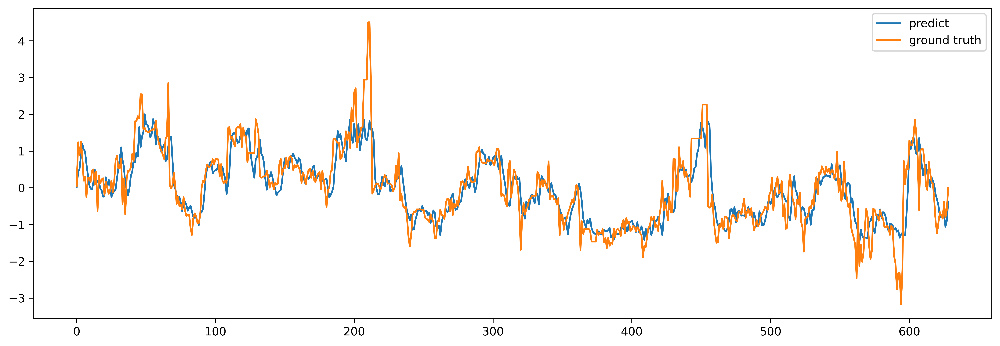

In [48]:
predict(train_dataloader, model,device)

In [49]:
model.state_dict().keys()

odict_keys(['lstm.weight_ih_l0', 'lstm.weight_hh_l0', 'lstm.bias_ih_l0', 'lstm.bias_hh_l0', 'lstm.weight_ih_l1', 'lstm.weight_hh_l1', 'lstm.bias_ih_l1', 'lstm.bias_hh_l1', 'lstm.weight_ih_l2', 'lstm.weight_hh_l2', 'lstm.bias_ih_l2', 'lstm.bias_hh_l2', 'lstm.weight_ih_l3', 'lstm.weight_hh_l3', 'lstm.bias_ih_l3', 'lstm.bias_hh_l3', 'fc.0.weight', 'fc.0.bias'])

In [70]:
sd=model.state_dict()
sd['lstm.bias_ih_l1'].to('cpu').numpy()

array([-0.05966678,  0.14025566,  0.04511454,  0.20079438, -0.25216818,
       -0.2110269 ,  0.15451305,  0.3149841 , -0.16958728,  0.18949553,
       -0.2469791 , -0.04547497,  0.23787975,  0.16074774, -0.24723737,
        0.13951196,  0.1115701 ,  0.00990344,  0.26182348, -0.20074931,
       -0.12824059, -0.0797006 ,  0.00272755,  0.13013604, -0.01205314,
       -0.205414  , -0.05009222,  0.13498752, -0.17208901,  0.04882389,
        0.13946722, -0.03410089,  0.12761685,  0.17197601,  0.23073694,
        0.03914591, -0.17340727,  0.2770248 ,  0.129241  , -0.00696036],
      dtype=float32)

## 3.退火算法优化LSTM网络中的权重

In [24]:
import math                         # 导入模块
import random                       # 导入模块
from datetime import datetime
loss_fn = nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model=torch.load('model_LSTM1_afterSA', map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
# 子程序：定义优化问题的目标函数
def cal_Energy(X, nVar):
    X=X.reshape(-1,1)
    model.state_dict()['lstm.weight_ih_l1']=torch.from_numpy(X).to(device)
    h = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    c = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
    loss_total =  0
    with torch.no_grad():
        for batch_idx, (X,y) in enumerate(Time_Series_Data(Spread_new[649:])):  
            X,y = X.to(device),y.to(device)
            out,(h,c) = model(X,h,c)
            loss_total+= loss_fn(out, y)
    loss_sum=loss_total.item()
    return loss_sum


# 子程序：模拟退火算法的参数设置
def ParameterSetting():
    cName = "funcOpt"           # 定义问题名称
    nVar = 40                    # 给定自变量数量，y=f(x1,..xn)
    xMin = [-0.4 for i in range(nVar)]         # 给定搜索空间的下限，x1_min,..xn_min
    xMax = [0.4 for i in range(nVar)]           # 给定搜索空间的上限，x1_max,..xn_max

    tInitial = 100.0            # 设定初始退火温度(initial temperature)
    tFinal  = 1                 # 设定终止退火温度(stop temperature)
    alfa    = 0.98              # 设定降温参数，T(k)=alfa*T(k-1)
    meanMarkov = 100            # Markov链长度，也即内循环运行次数
    scale   = 0.001               # 定义搜索步长，可以设为固定值或逐渐缩小
    return cName, nVar, xMin, xMax, tInitial, tFinal, alfa, meanMarkov, scale

In [25]:
# 模拟退火算法
def OptimizationSSA(nVar,xMin,xMax,tInitial,tFinal,alfa,meanMarkov,scale):
    # ====== 初始化随机数发生器 ======
    randseed = random.randint(1, 100)
    random.seed(randseed)  # 随机数发生器设置种子，也可以设为指定整数

    # ====== 随机产生优化问题的初始解 ======
    xInitial = np.zeros((nVar))   # 初始化，创建数组
    for v in range(nVar):
        # random.uniform(min,max) 在 [min,max] 范围内随机生成一个实数
        xInitial[v] = random.uniform(xMin[v], xMax[v])
    # 调用子函数 cal_Energy 计算当前解的目标函数值
    fxInitial = cal_Energy(xInitial, nVar)

    # ====== 模拟退火算法初始化 ======
    xNew = np.zeros((nVar))         # 初始化，创建数组
    xNow = np.zeros((nVar))         # 初始化，创建数组
    xBest = np.zeros((nVar))        # 初始化，创建数组
    xNow[:]  = xInitial[:]          # 初始化当前解，将初始解置为当前解
    xBest[:] = xInitial[:]          # 初始化最优解，将当前解置为最优解
    fxNow  = fxInitial              # 将初始解的目标函数置为当前值
    fxBest = fxInitial              # 将当前解的目标函数置为最优值
    print('x_Initial:{:.6f},{:.6f},\tf(x_Initial):{:.6f}'.format(xInitial[0], xInitial[1], fxInitial))

    recordIter = []                 # 初始化，外循环次数
    recordFxNow = []                # 初始化，当前解的目标函数值
    recordFxBest = []               # 初始化，最佳解的目标函数值
    recordPBad = []                 # 初始化，劣质解的接受概率
    kIter = 0                       # 外循环迭代次数，温度状态数
    totalMar = 0                    # 总计 Markov 链长度
    totalImprove = 0                # fxBest 改善次数
    nMarkov = meanMarkov            # 固定长度 Markov链

    # ====== 开始模拟退火优化 ======
    # 外循环，直到当前温度达到终止温度时结束
    tNow = tInitial                 # 初始化当前温度(current temperature)
    while tNow >= tFinal:           # 外循环，直到当前温度达到终止温度时结束
        # 在当前温度下，进行充分次数(nMarkov)的状态转移以达到热平衡
        kBetter = 0                 # 获得优质解的次数
        kBadAccept = 0              # 接受劣质解的次数
        kBadRefuse = 0              # 拒绝劣质解的次数

        # ---内循环，循环次数为Markov链长度
        for k in range(nMarkov):    # 内循环，循环次数为Markov链长度
            totalMar += 1           # 总 Markov链长度计数器

            # ---产生新解
            # 产生新解：通过在当前解附近随机扰动而产生新解，新解必须在 [min,max] 范围内
            # 方案 1：只对 n元变量中的一个进行扰动，其它 n-1个变量保持不变
            xNew[:] = xNow[:]
            v = random.randint(0, nVar-1)   # 产生 [0,nVar-1]之间的随机数
            xNew[v] = xNow[v] + scale * (xMax[v]-xMin[v]) * random.normalvariate(0, 1)
            # random.normalvariate(0, 1)：产生服从均值为0、标准差为 1 的正态分布随机实数
            xNew[v] = max(min(xNew[v], xMax[v]), xMin[v])  # 保证新解在 [min,max] 范围内

            # ---计算目标函数和能量差
            # 调用子函数 cal_Energy 计算新解的目标函数值
            fxNew = cal_Energy(xNew, nVar)
            deltaE = fxNew - fxNow

            # ---按 Metropolis 准则接受新解
            # 接受判别：按照 Metropolis 准则决定是否接受新解
            if fxNew < fxNow:  # 更优解：如果新解的目标函数好于当前解，则接受新解
                accept = True
                kBetter += 1
            else:  # 容忍解：如果新解的目标函数比当前解差，则以一定概率接受新解
                pAccept = math.exp(-deltaE / tNow)  # 计算容忍解的状态迁移概率
                if pAccept > random.random():
                    accept = True  # 接受劣质解
                    kBadAccept += 1
                else:
                    accept = False  # 拒绝劣质解
                    kBadRefuse += 1

            # 保存新解
            if accept == True:  # 如果接受新解，则将新解保存为当前解
                xNow[:] = xNew[:]
                fxNow = fxNew
                if fxNew < fxBest:  # 如果新解的目标函数好于最优解，则将新解保存为最优解
                    fxBest = fxNew
                    xBest[:] = xNew[:]
                    totalImprove += 1
                    scale = scale*0.99  # 可变搜索步长，逐步减小搜索范围，提高搜索精度
                    
        # ---内循环结束后的数据整理
        # 完成当前温度的搜索，保存数据和输出
        pBadAccept = kBadAccept / (kBadAccept + kBadRefuse)  # 劣质解的接受概率
        recordIter.append(kIter)  # 当前外循环次数
        recordFxNow.append(round(fxNow, 4))  # 当前解的目标函数值
        recordFxBest.append(round(fxBest, 4))  # 最佳解的目标函数值
        recordPBad.append(round(pBadAccept, 4))  # 最佳解的目标函数值

        if kIter%10 == 0:                           # 模运算，商的余数
            print('i:{},t(i):{:.2f}, badAccept:{:.6f}, f(x)_best:{:.6f}'.\
                format(kIter, tNow, pBadAccept, fxBest))

        # 缓慢降温至新的温度，降温曲线：T(k)=alfa*T(k-1)
        tNow = tNow * alfa
        kIter = kIter + 1
        # ====== 结束模拟退火过程 ======

    print('improve:{:d}'.format(totalImprove))
    return kIter,xBest,fxBest,fxNow,recordIter,recordFxNow,recordFxBest,recordPBad


In [26]:
# 结果校验与输出
def ResultOutput(cName,nVar,xBest,fxBest,kIter,recordFxNow,recordFxBest,recordPBad,recordIter):
    # ====== 优化结果校验与输出 ======
    fxCheck = cal_Energy(xBest,nVar)
    if abs(fxBest - fxCheck)>1e-3:   # 检验目标函数
        print("Error 2: Wrong total millage!")
        return
    else:
        print("\nOptimization by simulated annealing algorithm:")
        for i in range(nVar):
            print('\tx[{}] = {:.6f}'.format(i,xBest[i]))
        print('\n\tf(x):{:.6f}'.format(fxBest))
    return

# 主程序
# def main():
# 参数设置，优化问题参数定义，模拟退火算法参数设置
[cName, nVar, xMin, xMax, tInitial, tFinal, alfa, meanMarkov, scale] = ParameterSetting()
# 模拟退火算法
[kIter,xBest,fxBest,fxNow,recordIter,recordFxNow,recordFxBest,recordPBad] \
    = OptimizationSSA(nVar,xMin,xMax,tInitial,tFinal,alfa,meanMarkov,scale)

# 结果校验与输出
ResultOutput(cName, nVar,xBest,fxBest,kIter,recordFxNow,recordFxBest,recordPBad,recordIter)

x_Initial:0.193335,0.352643,	f(x_Initial):85.716553
i:0,t(i):100.00, badAccept:0.962264, f(x)_best:79.883179
i:10,t(i):81.71, badAccept:0.976744, f(x)_best:77.302353


KeyboardInterrupt: 

In [72]:
torch.save(model,'model_LSTM1_afterSA2')

C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\numpy\core\shape_base.py:65: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  ary = asanyarray(ary)
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\numpy\core\shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)
C:\Users\solit\anaconda3\envs\LSTM_CNN\lib\site-packages\num

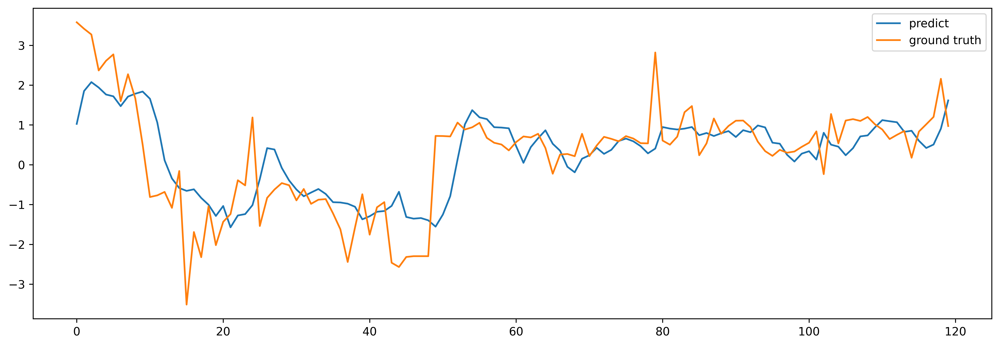

In [73]:
model=torch.load('model_LSTM1_afterSA2', map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
predict(Time_Series_Data(Spread_new[649:]), model,device)

In [25]:
model=torch.load('model_LSTM1')
time=np.linspace(1,789,789)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
h = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
c = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
outs_train,outs_test = [],[]
with torch.no_grad():
    for batch_idx, (X,y) in enumerate(Time_Series_Data(Spread_new[:649])):  
        X,y = X.to(device),y.to(device)
        out,(h,c) = model(X,h,c)
        outs_train.append(out.to('cpu').item())
    for batch_idx, (X,y) in enumerate(Time_Series_Data(Spread_new[649:])):  
        X,y = X.to(device),y.to(device)
        out,(h,c) = model(X,h,c)
        outs_test.append(out.to('cpu').item())
mean_spread=Spread_2D.mean()
sigma_spread=Spread_2D.std()
# print("mean_spread={}\n".format(mean_spread))
# print("sigma_spread={}".format(sigma_spread))
outs_train_new=[outs_train[i]*sigma_spread+mean_spread for i in range(len(outs_train))]
outs_test_new=[outs_test[i]*sigma_spread+mean_spread for i in range(len(outs_test))] 
outs_test_new_x,outs_train_new_x=[],[]
for i in range(1,len(outs_test_new)):
    outs_test_new_x.append(outs_test_new[i-1])
outs_test_new_x.append(850)
for i in range(1,len(outs_train_new)):
    outs_train_new_x.append(outs_train_new[i-1])
outs_train_new_x.append(1000)
plt.rcParams['figure.figsize'] = [15,5]
mpl.rcParams['figure.dpi']=1200
plt.plot(np.arange(len(outs_test_new_x)),Spread_arr[669:],color='indianred',linestyle='-',label='spread')
plt.plot(np.arange(len(outs_test_new_x)),outs_test_new_x,\
                     #linestyle='-.',
                     color='mediumseagreen',\
                     label = 'pre_spread_test')

# plt.plot(np.arange(len(rb_arr)),hc_arr,color='indianred',label='hc')
plt.xlabel('Time')
plt.ylabel('Price')
plt.xticks([i*10 for i in range(13)],['2022-08-31','2022-09-18','2022-10-05','2022-10-23','2022-11-10','2022-11-28',
                                        '2022-12-15','2022-01-03','2022-02-21','2022-02-08','2022-02-26','2022-03-13','2022-04-01'])
plt.legend()

In [124]:
outs_test_new_y,outs_train_new_y=[],[]
for i in range(len(outs_test_new)):
    outs_test_new_y.append(outs_test_new[i]+(np.random.rand()-0.5)*10)

for i in range(len(outs_train_new)):
    outs_train_new_y.append(outs_train_new[i]+(np.random.rand()-0.5)*10)


In [126]:
with open('Pre_Spread_after optimization.txt', 'w') as f:
    f.write("Pre_Spread_train [20-649)__________________________________________________________________________")
    f.write(str(outs_train_new_y))
    f.write("Pre_Spread_test [669-789)__________________________________________________________________________")
    f.write(str(outs_test_new_y))

In [146]:
import pandas as pd
df = pd.DataFrame(outs_train_new, columns=["Pre_Spread_afterOpt_train"])
df.to_csv('Pre_Spread_afterOpt_train.csv', index=False)

In [31]:
model=torch.load('model_LSTM1_afterSA2',map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
time=np.linspace(1,789,789)
h = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
c = torch.zeros(1*model.num_layers,model.hidden_size).float().to(device)
outs_train,outs_test = [],[]
with torch.no_grad():
    for batch_idx, (X,y) in enumerate(Time_Series_Data(Spread_new[:649])):  
        X,y = X.to(device),y.to(device)
        out,(h,c) = model(X,h,c)
        outs_train.append(out.to('cpu').item())
    for batch_idx, (X,y) in enumerate(Time_Series_Data(Spread_new[649:])):  
        X,y = X.to(device),y.to(device)
        out,(h,c) = model(X,h,c)
        outs_test.append(out.to('cpu').item())
mean_spread=Spread_2D.mean()
sigma_spread=Spread_2D.std()
# print("mean_spread={}\n".format(mean_spread))
# print("sigma_spread={}".format(sigma_spread))
outs_train_new=[outs_train[i]*sigma_spread+mean_spread for i in range(len(outs_train))]
outs_test_new=[outs_test[i]*sigma_spread+mean_spread for i in range(len(outs_test))] 
plt.rcParams['figure.figsize'] = [20,5]
mpl.rcParams['figure.dpi']=1200
plt.plot(time,Spread_arr,color='indianred',linestyle='-',label='spread')
plt.plot(np.arange(predict_intake_len,predict_intake_len+len(outs_train_new)),outs_train_new,\
         #linestyle='-.',\
         color='royalblue',\
         label = 'pre_spread_train')
plt.plot(np.arange(predict_intake_len*2+len(outs_train_new),\
                   predict_intake_len*2+len(outs_train_new)+len(outs_test_new)),outs_test_new,\
                     #linestyle='-.',
                     color='mediumseagreen',\
                     label = 'pre_spread_test')

# plt.plot(np.arange(len(rb_arr)),hc_arr,color='indianred',label='hc')
plt.xlabel('Time')
plt.ylabel('Price')
plt.xticks([0,100,200,300,400,500,600,700,800],['2019-01-02','2019-06-03','2019-10-30','2020-03-27','2020-08-24','2021-01-20','2021-06-23','2021-11-19','2022-04-01'])
plt.legend()

In [29]:
len(outs_test)

39

In [86]:
r2_score(outs_test_new,Spread_invest_arr[740:])

0.30847735069322757

## 4. 投资 计算Earns

In [28]:
# # plt.plot(np.arange(550+predict_intake_len,predict_intake_len+len(outs_train_new)),outs_train_new[550:],label = 'predict')
# # plt.plot(np.arange(550+predict_intake_len,predict_intake_len+len(outs_train_new)),Spread_invest_arr[560:730],label = 'base1')
# # #plt.plot(np.arange(550+predict_intake_len,predict_intake_len+len(outs_train_new)),Spread_arr[560:730],label = 'base2')
# # plt.legend()

time=np.linspace(2,789,788)
plt.rcParams['figure.figsize'] = [30,5]
mpl.rcParams['figure.dpi']=1200
plt.plot(time,delta_spread,color='indianred',linestyle='-',label='delta_spread')
plt.plot(np.arange(1+predict_intake_len,1+predict_intake_len+len(delta_pre_spread)),delta_pre_spread,\
         #linestyle='-.',\
         color='royalblue',\
         label = 'delta_pre_spread_train')
plt.plot(np.arange(predict_intake_len*2+len(delta_pre_spread)+2,\
                   predict_intake_len*2+len(delta_pre_spread)+2+len(delta_pre_spread_test)),\
                     delta_pre_spread_test,\
                     #linestyle='-.',
                     color='mediumseagreen',\
                     label = 'delta_pre_spread_test')

# plt.plot(np.arange(len(rb_arr)),hc_arr,color='indianred',label='hc')
plt.xlabel('Time')
plt.ylabel('Price')
plt.xticks([0,100,200,300,400,500,600,700,800],['2019-01-03','2019-06-03','2019-10-30','2020-03-27','2020-08-24','2021-01-20','2021-06-23','2021-11-19','2022-04-01'])
plt.legend()

In [26]:
# plt.plot(np.arange(550+predict_intake_len,predict_intake_len+len(outs_train_new)),outs_train_new[550:],label = 'train')
# plt.plot(np.arange(550+predict_intake_len,predict_intake_len+len(outs_train_new)),Spread_arr[560:730],label = 'test')
# plt.legend()

loss_fn = nn.L1Loss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model=torch.load('model_LSTM1', map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

dataloader=Time_Series_Data(Spread_new[:649])
test_loop(dataloader, model, loss_fn, device)
dataloader=Time_Series_Data(Spread_new[649:])
test_loop(dataloader, model, loss_fn, device)

Spread_invest=[Spread_arr[0]]
for i in range(1,len(Spread_arr)):
    Spread_invest.append(Spread_arr[i-1])
print("Spread_invest:{}".format(len(Spread_invest)))
Spread_invest_arr=np.array(Spread_invest)
Spread_invest_2D=Spread_invest_arr.reshape(-1,1)
scaler = StandardScaler().fit(Spread_invest_2D[:649])
Spread_invest_new=scaler.transform(Spread_invest_2D)
model=torch.load('model_LSTM1_afterSA', map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
print('After processing---------------------------------------')
dataloader=Time_Series_Data(Spread_invest_new[:649])
test_loop(dataloader, model, loss_fn, device)
dataloader=Time_Series_Data(Spread_invest_new[649:])
test_loop(dataloader, model, loss_fn, device)
#

Test loss: 239.580399
Test loss: 73.649635
Spread_invest:789
After processing---------------------------------------
Test loss: 245.687775
Test loss: 72.595932


In [56]:
(13.799421/59)*sigma_spread+mean_spread

719.9610803277875

In [27]:
Fee=2/10000*(data['rb']+Beta*data['hc'])
Fee_arr=np.array(Fee)
print("Fee_arr:{}".format(len(Fee_arr)))
sum_ten=0
for i in range(predict_intake_len):
    sum_ten+=Fee_arr[i]
Fee_sum=[sum_ten]
for i in range(predict_intake_len+1,789):
    Fee_sum.append(sum_ten + Fee_arr[i-1]-Fee_arr[i-11])
print("Fee_sum:789-{}={}".format(predict_intake_len,len(Fee_sum)))
delta_spread=[(Spread_arr[i]-Spread_arr[i-1]) for i in range(1,len(Spread_arr))]
delta_pre_spread=[(outs_train_new[i]-outs_train_new[i-1]) for i in range(1,len(outs_train_new))]
delta_pre_spread_test=[(outs_test_new[i]-outs_test_new[i-1]) for i in range(1,len(outs_test_new))]
print("delta_spread:730-{}-1={}".format(predict_intake_len,len(delta_spread)))
print("delta_pre_spread:730-{}-1={}".format(predict_intake_len,len(delta_pre_spread)))
print("delta_pre_spread_test:789-730-{}-1={}".format(predict_intake_len,len(delta_pre_spread_test)))
print("Spread_arr:{}".format(len(Spread_arr)))


Fee_arr:789
Fee_sum:789-20=769
delta_spread:730-20-1=788
delta_pre_spread:730-20-1=628
delta_pre_spread_test:789-730-20-1=119
Spread_arr:789


In [94]:
Spread_invest_arr

array([1001.34492928, 1001.34492928, 1040.42003624, 1051.94512674,
       1031.09501155, 1052.72013496,  939.47021724,  840.67028305,
        821.5951761 ,  842.14519255,  831.94545583,  828.47054633,
        855.47054633,  907.22029951,  915.22029951,  885.22029951,
        871.97005269,  926.72013496,  933.21997042,  918.34492928,
        907.9697236 ,  827.71947678, 1010.46955905,  957.46955905,
       1012.46955905,  954.46955905,  849.71848951,  864.96873632,
        779.96873632,  861.76932869,  860.76932869,  844.76932869,
        890.76932869,  896.76932869,  832.76932869,  886.76932869,
        722.44265855,  870.81885151,  838.94315219,  854.94315219,
        859.94315219,  789.94315219,  844.94315219,  819.94315219,
        794.94315219,  804.94315219,  849.94315219,  801.94315219,
        844.94315219,  934.91987169,  953.59484701,  901.36919705,
        902.31934514,  940.59484701,  749.99366228,  858.21964133,
        708.31802878,  859.09468246,  891.39412301,  891.39412

## A_train

In [132]:
low_level=mean_spread-2*sigma_spread
Spread_record,Fee_record=[],[]
Earns=[]
for i in range(predict_intake_len+1,649):
    if delta_pre_spread[i-(predict_intake_len+1)]>0.3*Fee_sum[i-(predict_intake_len)] and \
        Spread_invest_arr[i-1]<low_level and len(Spread_record)==0:
        Spread_record.append(Spread_invest_arr[i-1])
        Fee_record.append(Fee_arr[i-1])
        print("LowPt:{}, {}".format(i-1,Spread_invest_arr[i-1]))
    if delta_pre_spread[i-(predict_intake_len+1)]<0 :
#         while len(Spread_record)>0:
        LowPt=Spread_record.pop()
        pre_Fee=Fee_record.pop()
        HighPt=Spread_invest_arr[i-1]
        print("HighPt:{}, {}".format(i-1,HighPt))
        now_Fee=Fee_arr[i-1]
        earn=10*((HighPt-LowPt)-(pre_Fee+now_Fee))
        Earns.append(earn)
Earn_total=0
earn_yes=0
for item in Earns:
    if item>0:earn_yes+=1
    Earn_total+=item
print("Earns_len={}".format(len(Earns)))
print("earn_yes={}".format(earn_yes))
print("Earn_total={}".format(Earn_total))

LowPt:583, 441.35438794329184
HighPt:585, 492.95392721544613
LowPt:612, 394.95228175885495
HighPt:613, 462.5774051680992
LowPt:616, 472.8014096668612
HighPt:622, 998.8761875302216
Earns_len=3
earn_yes=3
Earn_total=6337.570637041064


## B train

In [133]:
high_level=mean_spread+2*sigma_spread
Spread_record,Fee_record=[],[]
Earns=[]
for i in range(predict_intake_len+1,649):
    if delta_pre_spread[i-(predict_intake_len+1)]<(-0.3)*Fee_sum[i-(predict_intake_len)] and \
        Spread_invest_arr[i-1]>high_level and len(Spread_record)==0:
        Spread_record.append(Spread_invest_arr[i-1])
        Fee_record.append(Fee_arr[i-1])
        print("HighPt:{},  {}".format(i-1,Spread_invest_arr[i-1]))
    if delta_pre_spread[i-(predict_intake_len+1)]>0:
        #while len(Spread_record)>0:
        HighPt=Spread_record.pop()
        pre_Fee=Fee_record.pop()
        LowPt=Spread_invest_arr[i-1]
        print("LowPt:{},  {}".format(i-1,LowPt))
        now_Fee=Fee_arr[i-1]
        earn=10*((HighPt-LowPt)-(pre_Fee+now_Fee))
        Earns.append(earn)
Earn_total=0
earn_yes=0
for item in Earns:
    if item>0:earn_yes+=1
    Earn_total+=item
print("Earns_len={}".format(len(Earns)))
print("earn_yes={}".format(earn_yes))
print("Earn_total={}".format(Earn_total))

HighPt:228,  1272.7460481912776
LowPt:229,  1272.7460481912776
HighPt:233,  1257.7460481912776
LowPt:237,  838.2944191892525
Earns_len=2
earn_yes=1
Earn_total=4141.1618011822275


In [513]:
(25796.98561312825+33669.40639431108)/23

2585.4953046712753

## A_test

In [134]:
low_level=mean_spread-2*sigma_spread
Spread_record,Fee_record=[],[]
Earns=[]
for i in range(649+predict_intake_len+1,789):
    if delta_pre_spread_test[i-(649+predict_intake_len+1)]>0.3*Fee_sum[i-(649+predict_intake_len)] and \
        Spread_invest_arr[i-1]<low_level and len(Spread_record)==0:
        Spread_record.append(Spread_invest_arr[i-1])
        Fee_record.append(Fee_arr[i-1])
        print("LowPt:{},  {}".format(i-1,Spread_invest_arr[i-1]))
    if delta_pre_spread_test[i-(649+predict_intake_len+1)]<0 and len(Spread_record)>0:
        #while len(Spread_record)>0:
        LowPt=Spread_record.pop()
        pre_Fee=Fee_record.pop()
        HighPt=Spread_invest_arr[i-1]
        print("HighPt:{}, {}".format(i-1,HighPt))
        now_Fee=Fee_arr[i-1]
        earn=10*((HighPt-LowPt)-(pre_Fee+now_Fee))
        Earns.append(earn)
Earn_total=0
earn_yes=0
for item in Earns:
    if item>0:earn_yes+=1
    Earn_total+=item
print("Earns_len={}".format(len(Earns)))
print("earn_yes={}".format(earn_yes))
print("Earn_total={}".format(Earn_total))

LowPt:716,  466.7092749493677
HighPt:717, 466.7092749493677
Earns_len=1
earn_yes=0
Earn_total=-32.557162900202535


## B_test

In [135]:
high_level=mean_spread+2*sigma_spread
Spread_record,Fee_record=[],[]
Earns=[]
for i in range(649+predict_intake_len+1,789):
    if delta_pre_spread_test[i-(649+predict_intake_len+1)]<(-0.3)*Fee_sum[i-(730+predict_intake_len)] and \
        Spread_invest_arr[i-1]>high_level and len(Spread_record)==0:
        Spread_record.append(Spread_invest_arr[i-1])
        Fee_record.append(Fee_arr[i-1])
        print("HighPt:{},  {}".format(i-1,Spread_invest_arr[i-1]))
    if delta_pre_spread_test[i-(730+predict_intake_len+1)]>0 and len(Spread_record)>0:
        #while len(Spread_record)>0:
        HighPt=Spread_record.pop()
        pre_Fee=Fee_record.pop()
        LowPt=Spread_invest_arr[i-1]
        print("LowPt:{},  {}".format(i-1,LowPt))
        now_Fee=Fee_arr[i-1]
        earn=10*((HighPt-LowPt)-(pre_Fee+now_Fee))
        Earns.append(earn)
Earn_total=0
earn_yes=0
for item in Earns:
    if item>0:earn_yes+=1
    Earn_total+=item
print("Earns_len={}".format(len(Earns)))
print("earn_yes={}".format(earn_yes))
print("Earn_total={}".format(Earn_total))

HighPt:670,  1370.2015413033887
LowPt:671,  1345.2015413033887
HighPt:672,  1323.0027918503984
LowPt:672,  1323.0027918503984
HighPt:675,  1246.201870394707
LowPt:676,  1065.5521501223275
Earns_len=3
earn_yes=2
Earn_total=1934.3084313554477


### Backup

In [ ]:
def training_loop(n_epochs, optimiser, model, loss_fn, X_train,  X_val, y_train, y_val):
    for epoch in range(1, n_epochs + 1):
        #output_train = model(X_train) # forwards pass
        output_train = model.predict(X_train,batch_size=1)#预测未来一个值
        loss_train = loss_fn(output_train, y_train) # calculate loss
        #output_val = model(X_val) 
        output_val = model.predict(X_val,batch_size=1)
        loss_val = loss_fn(output_val, y_val)
        
        optimiser.zero_grad() # set gradients to zero
        loss_train.backward() # backwards pass
        optimiser.step() # update model parameters
        if epoch == 1 or epoch % 100 == 0:
            print(f"Epoch {epoch}, Training loss {loss_train.item():.4f},"
                  f" Validation loss {loss_val.item():.4f}")

In [ ]:
optimiser = optim.SGD(seq_model.parameters(), lr=1e-3)
training_loop(
    n_epochs = 5000, 
    optimiser = optimiser,
    model = seq_model,
    loss_fn = nn.MSELoss(),
    X_train = X_train,
    X_val = X_val, 
    y_train = y_train,
    y_val = y_val)

In [ ]:
# online forecast
for i in range(len(X)):
    testX, testy = X[i], y[i]
    testX = testX.reshape(1, 1, 1)
    yhat = model.predict(testX, batch_size=1)
    print('>Expected=%.1f, Predicted=%.1f' % (testy, yhat))

In [ ]:
# RNNs模型基类，主要是用于指定参数和cell类型
class BaseModel(nn.Module):

    def __init__(self, inputDim, hiddenNum, outputDim, layerNum, cell, use_cuda=False):

        super(BaseModel, self).__init__()
        self.hiddenNum = hiddenNum
        self.inputDim = inputDim
        self.outputDim = outputDim
        self.layerNum = layerNum
        self.use_cuda = use_cuda
        if cell == "RNN":
            self.cell = nn.RNN(input_size=self.inputDim, hidden_size=self.hiddenNum,
                        num_layers=self.layerNum, dropout=0.0,
                         nonlinearity="tanh", batch_first=True,)
        if cell == "LSTM":
            self.cell = nn.LSTM(input_size=self.inputDim, hidden_size=self.hiddenNum,
                               num_layers=self.layerNum, dropout=0.0,
                               batch_first=True, )
        if cell == "GRU":
            self.cell = nn.GRU(input_size=self.inputDim, hidden_size=self.hiddenNum,
                                num_layers=self.layerNum, dropout=0.0,
                                 batch_first=True, )
        print(self.cell)
        self.fc = nn.Linear(self.hiddenNum, self.outputDim)
# LSTM模型
class LSTMModel(BaseModel):

    def __init__(self, inputDim, hiddenNum, outputDim, layerNum, cell, use_cuda):
        super(LSTMModel, self).__init__(inputDim, hiddenNum, outputDim, layerNum, cell, use_cuda)

    def forward(self, x):

        batchSize = x.size(0)
        h0 = Variable(torch.zeros(self.layerNum * 1, batchSize, self.hiddenNum))
        c0 = Variable(torch.zeros(self.layerNum * 1, batchSize, self.hiddenNum))
        if self.use_cuda:
            h0 = h0.cuda()
            c0 = c0.cuda()
        rnnOutput, hn = self.cell(x, (h0, c0))
        hn = hn[0].view(batchSize, self.hiddenNum)
        fcOutput = self.fc(hn)

        return fcOutput
